In [14]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from tqdm.notebook import tqdm

%config InlineBackend.figure_format = 'retina'
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Q1.1: Data Transformation

In [2]:
def round_time(time: str) -> str:
    """
    Round the time to the next hour.
    This function takes a time string in the format "HH:MM" and rounds it to the next hour.
    For example, "12:15" will be rounded to "13:00", and "12:00" will remain "12:00".
    Args:
        time (str): _description_

    Returns:
        str: _description_
    """
    data = time.split(":")
    hour = int(data[0])
    minute = int(data[1])
    hour = hour + 1 if minute > 0 else hour
    return f"{hour:02d}:00"

In [3]:
def add_missing_times(df):
    full_range = [f"{i:02d}:00" for i in range(49)] 
    
    # Create empty DataFrame with complete timeline
    full_df = pd.DataFrame({'Time': full_range})
    
    # Merge with original data
    merged = pd.merge(full_df, df, on='Time', how='left')
    
    return merged

In [4]:
# Create a dictionary to map the columns to their respective aggregation functions

d = {
    'Age': "last",
    'BUN': "max", 
    'Creatinine': "max", 
    'GCS': "min",
    'Gender': "last", 
    'Glucose': "max",  
    'HCO3': "min",
    'HCT': "min", 
    'HR': "max", 
    'Height': "last", 
    'ICUType': "last", 
    'K': "last", 
    'Mg': "last", 
    'NIDiasABP': "mean", 
    'NIMAP': "mean",
    'NISysABP': "mean", 
    'Na': "min", 
    'Platelets': "min", 
    'RecordID': "last", 
    'RespRate': "max", 
    'Temp': "max",
    'TroponinT': "max", 
    'Urine': "sum", 
    'WBC': "max", 
    'Weight': "last", 
    'ALP': "max", 
    'ALT': "max", 
    'AST': "max", 
    'Albumin': "min",
    'Bilirubin': "max", 
    'FiO2': "last", 
    'MechVent': "last", 
    'PaCO2': "max", 
    'PaO2': "max", 
    'pH': "min", 
    'DiasABP': "mean",
    'MAP': "mean", 
    'SaO2': "min", 
    'SysABP': "mean", 
    'Lactate': "max", 
    'Cholesterol': "last", 
    'TroponinI': "max"
}

# Create a new list of columns in the desired order, i.e., first the static variables followed by the dynamic variables
static_variables = ["Time", "RecordID", "Age", "Gender", "Height", "Weight", "ICUType"]
new_order = static_variables + list(set(d.keys()).difference(set(static_variables)))

In [6]:
# For the three provided datasets we perfrorm the following steps: 
for _set in ["a", "b", "c"]:
    
    # hold the new dataframes in a list
    pivoted_list = []
    for file in Path(f'../data/set-{_set}').glob('*.txt'):
        
        #read each file into a dataframe
        df = pd.read_csv(file)
        
        # apply the rounding function to the Time column
        df["Time"] = df.Time.apply(round_time)
        
        # pivot the dataframe so that all variables are in columns and apply the aggregation functions
        pivoted = df.pivot_table(index='Time', columns='Parameter', values='Value', aggfunc=["sum", "mean", "last", "min", "max"]).reset_index()
        
        # rename the columns base on the aggregation functions
        pivoted.columns = ['_'.join(col).strip() for col in pivoted.columns.values]
        pivoted = pivoted[["Time_"] + [f"{v}_{k}" for k, v in d.items() if f"{v}_{k}" in pivoted.columns]]
        
        # remove the prefixes from the columns
        pivoted.columns = [col.split("_")[1] if col != "Time_" else col[:-1] for col in pivoted.columns]
        
        # add missing time rows
        pivoted = add_missing_times(pivoted)
        
        # add the RecordID
        pivoted['RecordID'] = pivoted['RecordID'].iloc[0]
        
        # save the pivoted dataframe into a list
        pivoted_list.append(pivoted)
        
    # concatenating all the pivoted dataframes into one
    dataset = pd.concat(pivoted_list).reset_index(drop=True)
    
    # simplify the RECORD ID values
    dataset["RecordID"] = dataset["RecordID"].astype(int)
    
    # apply the new order to the columns
    dataset = dataset[new_order]
    
    # add the outcome column
    outcomes = pd.read_csv(f"../data/Outcomes-{_set}.txt")
    outcomes = outcomes[["RecordID", "In-hospital_death"]]
    dataset = dataset.set_index("RecordID").join(outcomes.set_index("RecordID")).reset_index()
    
    # write the new dataset to a parquet file
    dataset.to_parquet(f"../data/set-{_set}.parquet", index=False)

# Q1.2 Exploratory Data Analysis

In [5]:
train = pd.read_parquet("../data/set-a.parquet")
validation = pd.read_parquet("../data/set-b.parquet")
test = pd.read_parquet("../data/set-c.parquet")

In [6]:
train.columns

Index(['RecordID', 'Time', 'Age', 'Gender', 'Height', 'Weight', 'ICUType',
       'ALT', 'Cholesterol', 'Na', 'Platelets', 'Temp', 'PaCO2', 'PaO2',
       'Bilirubin', 'HCO3', 'NISysABP', 'GCS', 'RespRate', 'Glucose', 'Urine',
       'HCT', 'ALP', 'MechVent', 'SaO2', 'BUN', 'Mg', 'Albumin', 'TroponinI',
       'K', 'MAP', 'FiO2', 'NIMAP', 'HR', 'AST', 'pH', 'Creatinine', 'WBC',
       'Lactate', 'SysABP', 'TroponinT', 'DiasABP', 'NIDiasABP',
       'In-hospital_death'],
      dtype='object')

In [7]:
# Create dataset type columns
train['dataset'] = 'train'
validation['dataset'] = 'validation' 
test['dataset'] = 'test'

# Combine the datasets
combined_data = pd.concat([train, 
                         validation, 
                         test], axis=0)

train_data = combined_data[combined_data['dataset'] == 'train']
val_data = combined_data[combined_data['dataset'] == 'validation']
test_data = combined_data[combined_data['dataset'] == 'test']

In [8]:
categorical_vars = ["Gender", "ICUType", "MechVent", "GCS", "dataset"]
numerical_vars = ['Age', 'Height', 'Weight', 'TroponinI', 'Platelets', 'RespRate', 'NIMAP', 'ALP', 'K', 'WBC',
                  'AST', 'HR', 'TroponinT', 'NIDiasABP', 'pH', 'DiasABP', 'PaO2', 'Mg', 'Cholesterol', 'Temp', 
                  'Albumin', 'SaO2', 'HCT', "FiO2", 'PaCO2', 'BUN', 'Bilirubin', 'SysABP', 'NISysABP', 'Glucose',
                  'MAP', 'Na', 'HCO3', 'ALT', 'Creatinine', 'Urine', 'Lactate']
outcome_var = "In-hospital_death"

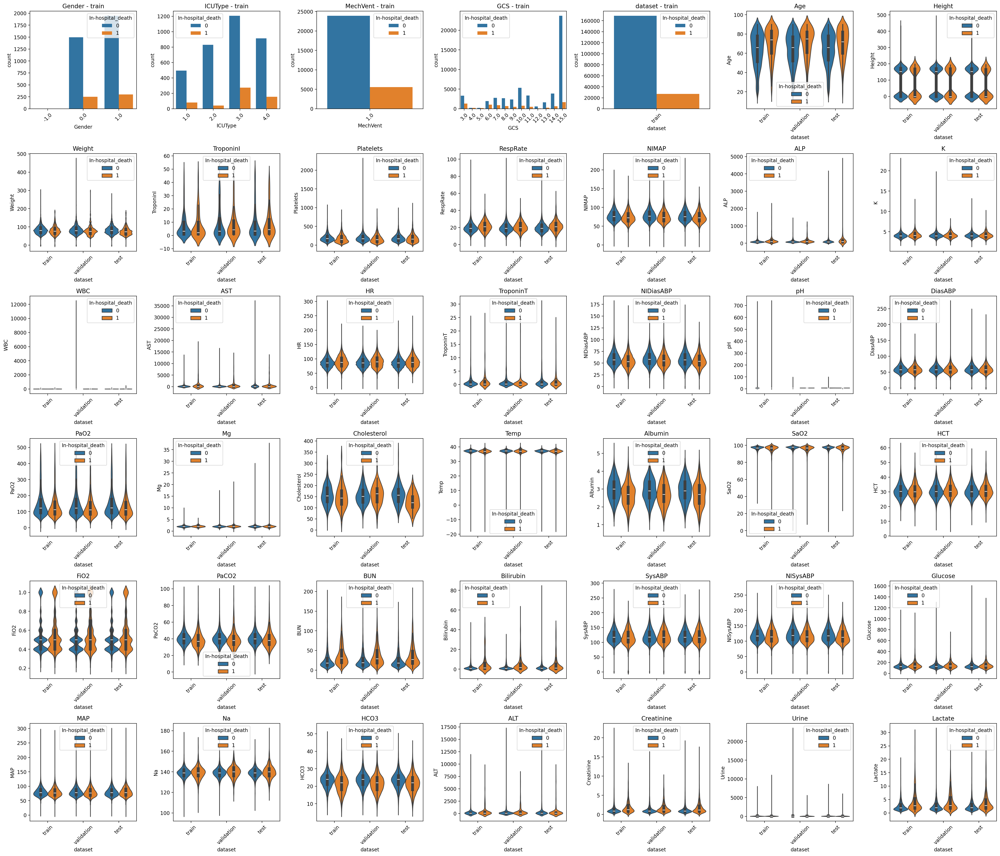

In [9]:
# Calculate number of rows needed (ceil division)
num_rows = (len(categorical_vars) + len(numerical_vars) + 6) // 7

# Create a figure with multiple subplots, 7 columns
fig, axes = plt.subplots(num_rows, 7, figsize=(28, num_rows * 4))
axes = axes.ravel()  # Flatten axes array for easier indexing

# Plot count plots for categorical variables
for i, var in enumerate(categorical_vars):
    if var in combined_data.columns:  # Only plot if variable exists in combined_data
        # Create separate plot for each dataset
        data_to_plot = combined_data[combined_data['dataset'].notnull()]
        sns.countplot(data=data_to_plot[data_to_plot['dataset'] == 'train'], 
                     x=var, 
                     hue=outcome_var, 
                     ax=axes[i])
        axes[i].set_title(f'{var} - train')
        axes[i].tick_params(axis='x', rotation=45)

# Plot violin plots for numerical variables
for i, var in enumerate(numerical_vars):
    if var in combined_data.columns:  # Only plot if variable exists in combined_data
        # Only select data that has non-null values for this variable
        valid_data = combined_data.dropna(subset=[var])
        sns.violinplot(data=valid_data, 
                      x='dataset', 
                      y=var, 
                      hue=outcome_var, 
                      ax=axes[len(categorical_vars) + i])
        axes[len(categorical_vars) + i].set_title(f'{var}')
        axes[len(categorical_vars) + i].tick_params(axis='x', rotation=45)

# Hide empty subplots
for i in range(len(categorical_vars) + len(numerical_vars), len(axes)):
    axes[i].set_visible(False)

plt.tight_layout()
plt.show()


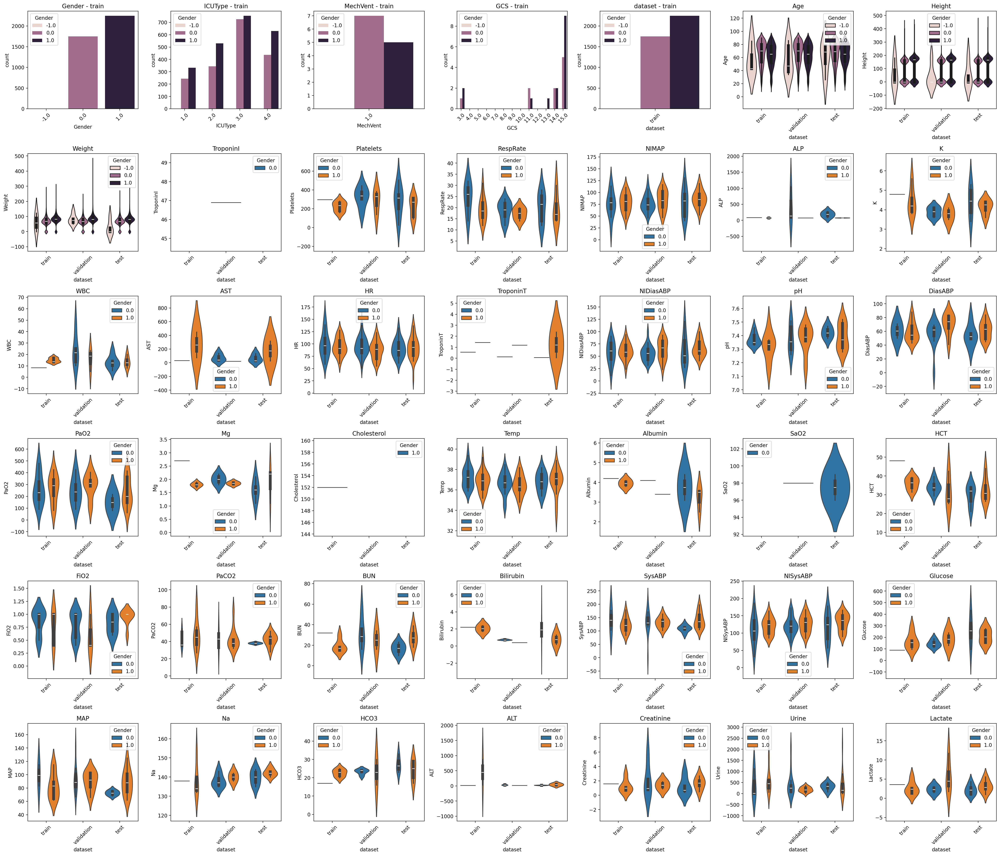

In [14]:
# Calculate number of rows needed (ceil division)
num_rows = (len(categorical_vars) + len(numerical_vars) + 6) // 7

# Create a figure with multiple subplots, 7 columns
fig, axes = plt.subplots(num_rows, 7, figsize=(28, num_rows * 4))
axes = axes.ravel()  # Flatten axes array for easier indexing

# Plot count plots for categorical variables
for i, var in enumerate(categorical_vars):
    if var in combined_data.columns:  # Only plot if variable exists in combined_data
        # Create separate plot for each dataset
        data_to_plot = combined_data[combined_data['dataset'].notnull()]
        sns.countplot(data=data_to_plot[data_to_plot['dataset'] == 'train'], 
                     x=var, 
                     hue='Gender', 
                     ax=axes[i])
        axes[i].set_title(f'{var} - train')
        axes[i].tick_params(axis='x', rotation=45)

# Plot violin plots for numerical variables
for i, var in enumerate(numerical_vars):
    if var in combined_data.columns:  # Only plot if variable exists in combined_data
        # Only select data that has non-null values for this variable
        valid_data = combined_data.dropna(subset=[var])
        sns.violinplot(data=valid_data, 
                      x='dataset', 
                      y=var, 
                      hue='Gender', 
                      ax=axes[len(categorical_vars) + i])
        axes[len(categorical_vars) + i].set_title(f'{var}')
        axes[len(categorical_vars) + i].tick_params(axis='x', rotation=45)

# Hide empty subplots
for i in range(len(categorical_vars) + len(numerical_vars), len(axes)):
    axes[i].set_visible(False)

plt.tight_layout()
plt.show()

In [10]:
def remove_outliers(df, columns=numerical_vars):
    df_clean = df.copy()
    
    for column in columns:
        # Calculate Q1, Q3, and IQR
        Q1 = df[column].quantile(0.25)
        Q3 = df[column].quantile(0.75)
        IQR = Q3 - Q1
        
        # Define outlier bounds
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        
        # Replace outliers with NaN
        df_clean[column] = df_clean[column].apply(lambda x: x if lower_bound <= x <= upper_bound else None)
    
    return df_clean

# Apply outlier removal to each dataset
train_clean = remove_outliers(train)
validation_clean = remove_outliers(validation)
test_clean = remove_outliers(test)

# Print the number of removed values for each variable
for var in numerical_vars:
    train_removed = train[var].count() - train_clean[var].count()
    val_removed = validation[var].count() - validation_clean[var].count()
    test_removed = test[var].count() - test_clean[var].count()
    
print(f"\n{var}:")
print(f"Train outliers removed: {train_removed}")
print(f"Validation outliers removed: {val_removed}")
print(f"Test outliers removed: {test_removed}")


Lactate:
Train outliers removed: 605
Validation outliers removed: 619
Test outliers removed: 575


In [11]:
# Create dataset type columns for the cleaned datasets
train_clean['dataset'] = 'train'
validation_clean['dataset'] = 'validation'
test_clean['dataset'] = 'test'

# Combine the cleaned datasets
combined_clean = pd.concat([train_clean, 
                          validation_clean, 
                          test_clean], axis=0)

# Reset index for the combined dataset
combined_clean = combined_clean.reset_index(drop=True)

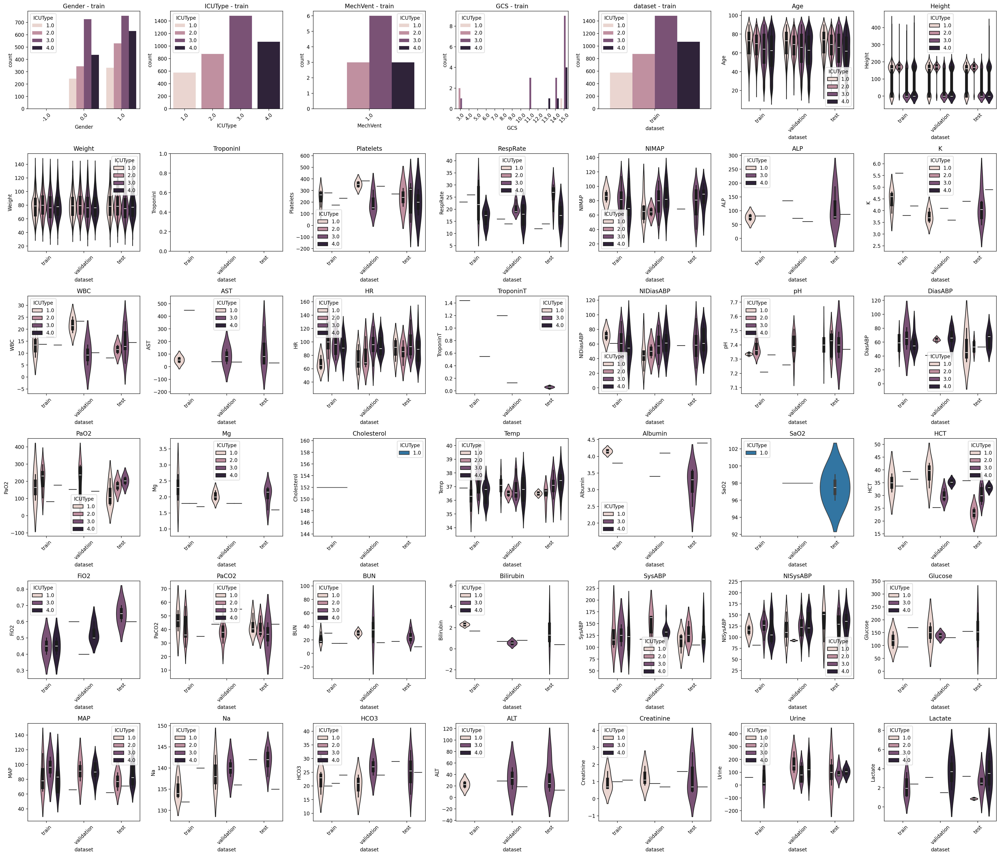

In [12]:
# Calculate number of rows needed (ceil division)
num_rows = (len(categorical_vars) + len(numerical_vars) + 6) // 7

# Create a figure with multiple subplots, 7 columns
fig, axes = plt.subplots(num_rows, 7, figsize=(28, num_rows * 4))
axes = axes.ravel()  # Flatten axes array for easier indexing

# Plot count plots for categorical variables
for i, var in enumerate(categorical_vars):
    if var in combined_clean.columns:  # Only plot if variable exists in combined_data
        # Create separate plot for each dataset
        data_to_plot = combined_clean[combined_clean['dataset'].notnull()]
        sns.countplot(data=data_to_plot[data_to_plot['dataset'] == 'train'], 
                     x=var, 
                     hue='ICUType', 
                     ax=axes[i])
        axes[i].set_title(f'{var} - train')
        axes[i].tick_params(axis='x', rotation=45)

# Plot violin plots for numerical variables
for i, var in enumerate(numerical_vars):
    if var in combined_clean.columns:  # Only plot if variable exists in combined_data
        # Only select data that has non-null values for this variable
        valid_data = combined_clean.dropna(subset=[var])
        sns.violinplot(data=valid_data, 
                      x='dataset', 
                      y=var, 
                      hue='ICUType', 
                      ax=axes[len(categorical_vars) + i])
        axes[len(categorical_vars) + i].set_title(f'{var}')
        axes[len(categorical_vars) + i].tick_params(axis='x', rotation=45)

# Hide empty subplots
for i in range(len(categorical_vars) + len(numerical_vars), len(axes)):
    axes[i].set_visible(False)

plt.tight_layout()
plt.show()

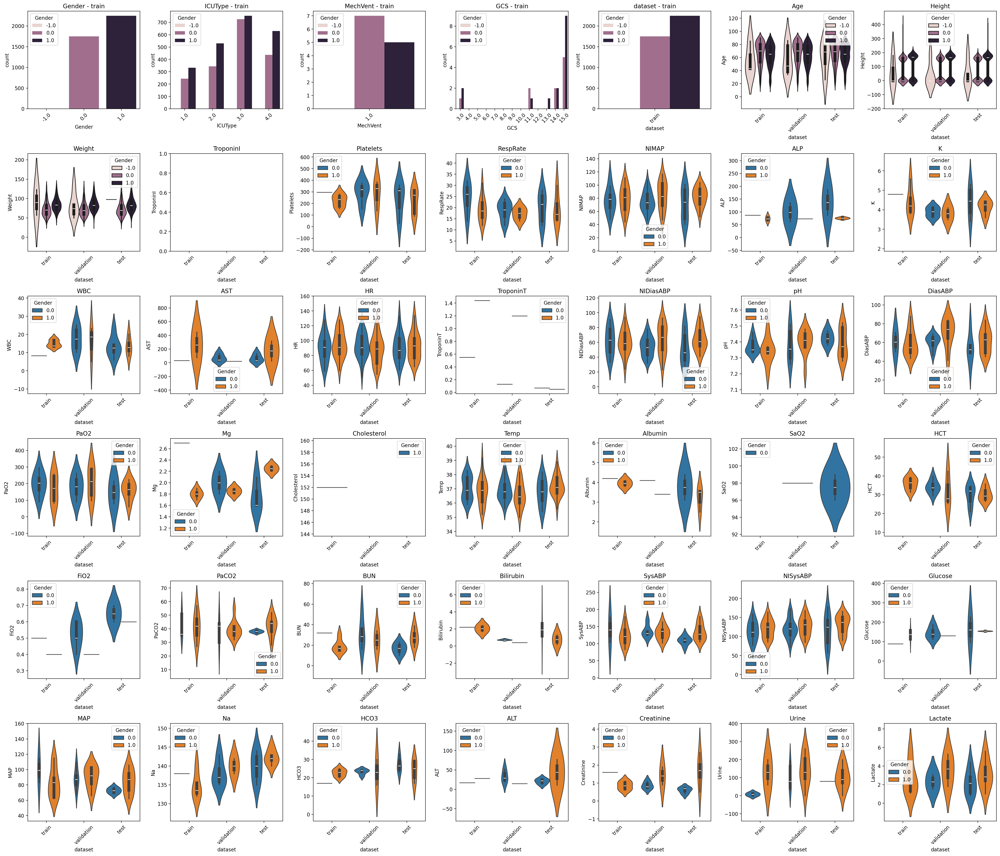

In [22]:
# Calculate number of rows needed (ceil division)
num_rows = (len(categorical_vars) + len(numerical_vars) + 6) // 7

# Create a figure with multiple subplots, 7 columns
fig, axes = plt.subplots(num_rows, 7, figsize=(28, num_rows * 4))
axes = axes.ravel()  # Flatten axes array for easier indexing

# Plot count plots for categorical variables
for i, var in enumerate(categorical_vars):
    if var in combined_clean.columns:  # Only plot if variable exists in combined_data
        # Create separate plot for each dataset
        data_to_plot = combined_clean[combined_clean['dataset'].notnull()]
        sns.countplot(data=data_to_plot[data_to_plot['dataset'] == 'train'], 
                     x=var, 
                     hue='Gender', 
                     ax=axes[i])
        axes[i].set_title(f'{var} - train')
        axes[i].tick_params(axis='x', rotation=45)

# Plot violin plots for numerical variables
for i, var in enumerate(numerical_vars):
    if var in combined_clean.columns:  # Only plot if variable exists in combined_data
        # Only select data that has non-null values for this variable
        valid_data = combined_clean.dropna(subset=[var])
        sns.violinplot(data=valid_data, 
                      x='dataset', 
                      y=var, 
                      hue='Gender', 
                      ax=axes[len(categorical_vars) + i])
        axes[len(categorical_vars) + i].set_title(f'{var}')
        axes[len(categorical_vars) + i].tick_params(axis='x', rotation=45)

# Hide empty subplots
for i in range(len(categorical_vars) + len(numerical_vars), len(axes)):
    axes[i].set_visible(False)

plt.tight_layout()
plt.show()

/var/folders/jp/s17dfmmd1lj9snp8qchr6nx00000gp/T/ipykernel_79791/3836316524.py:39: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  axes[len(categorical_vars) + i].legend(title='Age Group', bbox_to_anchor=(1.05, 1), loc='upper left')


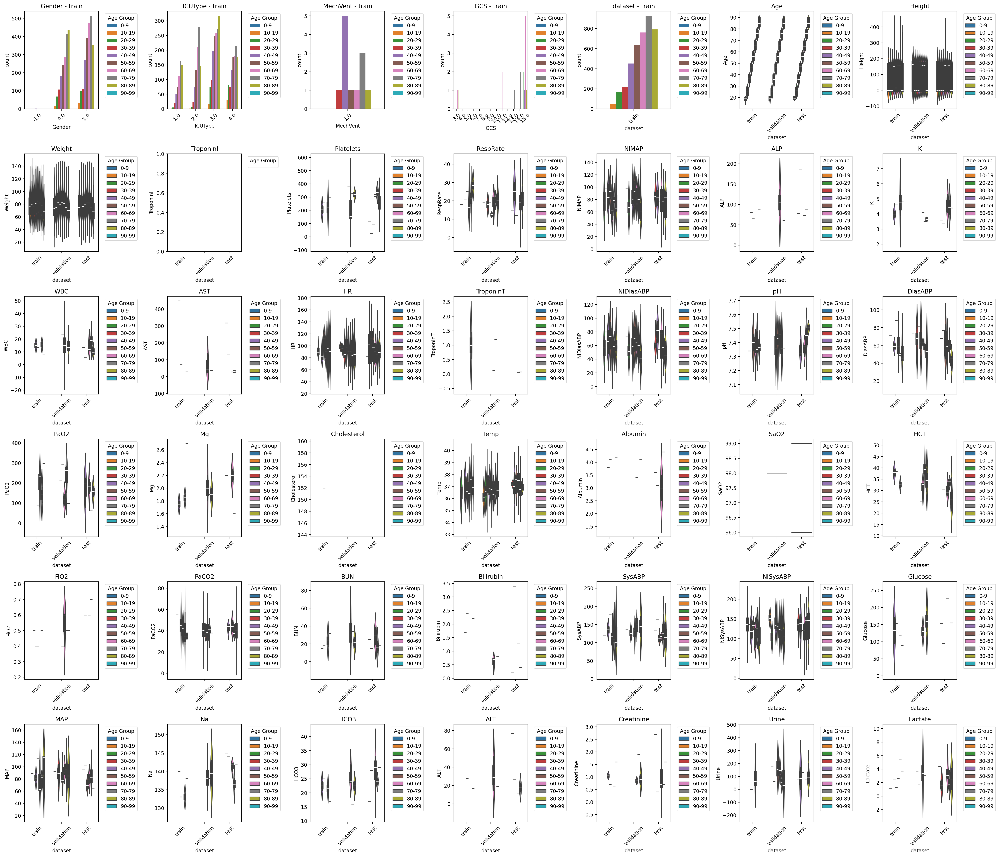

In [13]:
# First, create age bins in the combined data
combined_clean['Age_Bin'] = pd.cut(combined_clean['Age'], 
                                 bins=range(0, 101, 10),  # Create bins from 0 to 100 in steps of 10
                                 labels=[f'{i}-{i+9}' for i in range(0, 91, 10)])  # Create labels for bins

# Calculate number of rows needed (ceil division)
num_rows = (len(categorical_vars) + len(numerical_vars) + 6) // 7

# Create a figure with multiple subplots, 7 columns
fig, axes = plt.subplots(num_rows, 7, figsize=(28, num_rows * 4))
axes = axes.ravel()  # Flatten axes array for easier indexing

# Plot count plots for categorical variables
for i, var in enumerate(categorical_vars):
    if var in combined_clean.columns:  # Only plot if variable exists in combined_data
        # Create separate plot for each dataset
        data_to_plot = combined_clean[combined_clean['dataset'].notnull()]
        sns.countplot(data=data_to_plot[data_to_plot['dataset'] == 'train'], 
                     x=var, 
                     hue='Age_Bin', 
                     ax=axes[i])
        axes[i].set_title(f'{var} - train')
        axes[i].tick_params(axis='x', rotation=45)
        if var != 'Age_Bin':  # Avoid showing legend for Age_Bin plot itself
            axes[i].legend(title='Age Group', bbox_to_anchor=(1.05, 1), loc='upper left')

# Plot violin plots for numerical variables
for i, var in enumerate(numerical_vars):
    if var in combined_clean.columns:  # Only plot if variable exists in combined_data
        # Only select data that has non-null values for this variable
        valid_data = combined_clean.dropna(subset=[var])
        sns.violinplot(data=valid_data, 
                      x='dataset', 
                      y=var, 
                      hue='Age_Bin', 
                      ax=axes[len(categorical_vars) + i])
        axes[len(categorical_vars) + i].set_title(f'{var}')
        axes[len(categorical_vars) + i].tick_params(axis='x', rotation=45)
        axes[len(categorical_vars) + i].legend(title='Age Group', bbox_to_anchor=(1.05, 1), loc='upper left')

# Hide empty subplots
for i in range(len(categorical_vars) + len(numerical_vars), len(axes)):
    axes[i].set_visible(False)

plt.tight_layout()
plt.show()

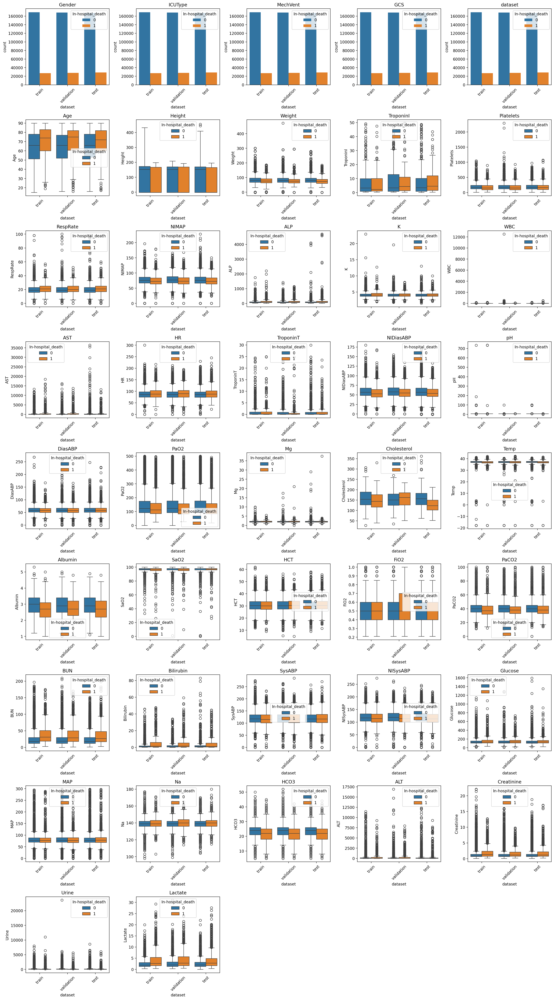

In [ ]:
# Calculate number of rows needed (ceil division)
num_rows = (len(categorical_vars) + len(numerical_vars) + 4) // 5

# Create a figure with multiple subplots, 5 columns
fig, axes = plt.subplots(num_rows, 5, figsize=(20, num_rows * 4))
axes = axes.ravel()  # Flatten axes array for easier indexing

# Plot count plots for categorical variables
for i, var in enumerate(categorical_vars):
    sns.countplot(data=combined_data[combined_data['dataset'].notnull()], 
                 x=var, 
                 hue=outcome_var, 
                 ax=axes[i])
    axes[i].set_title(f'{var}')
    axes[i].tick_params(axis='x', rotation=45)

# Plot violin plots for numerical variables
for i, var in enumerate(numerical_vars):
    if var in combined_data.columns:  # Only plot if variable exists in combined_data
        # Only select data that has non-null values for this variable
        valid_data = combined_data.dropna(subset=[var])
        sns.boxplot(data=valid_data, 
                      x='dataset', 
                      y=var, 
                      hue=outcome_var, 
                      ax=axes[len(categorical_vars) + i])
        axes[len(categorical_vars) + i].set_title(f'{var}')
        axes[len(categorical_vars) + i].tick_params(axis='x', rotation=45)

# Hide empty subplots
for i in range(len(categorical_vars) + len(numerical_vars), len(axes)):
    axes[i].set_visible(False)

plt.tight_layout()
plt.show()

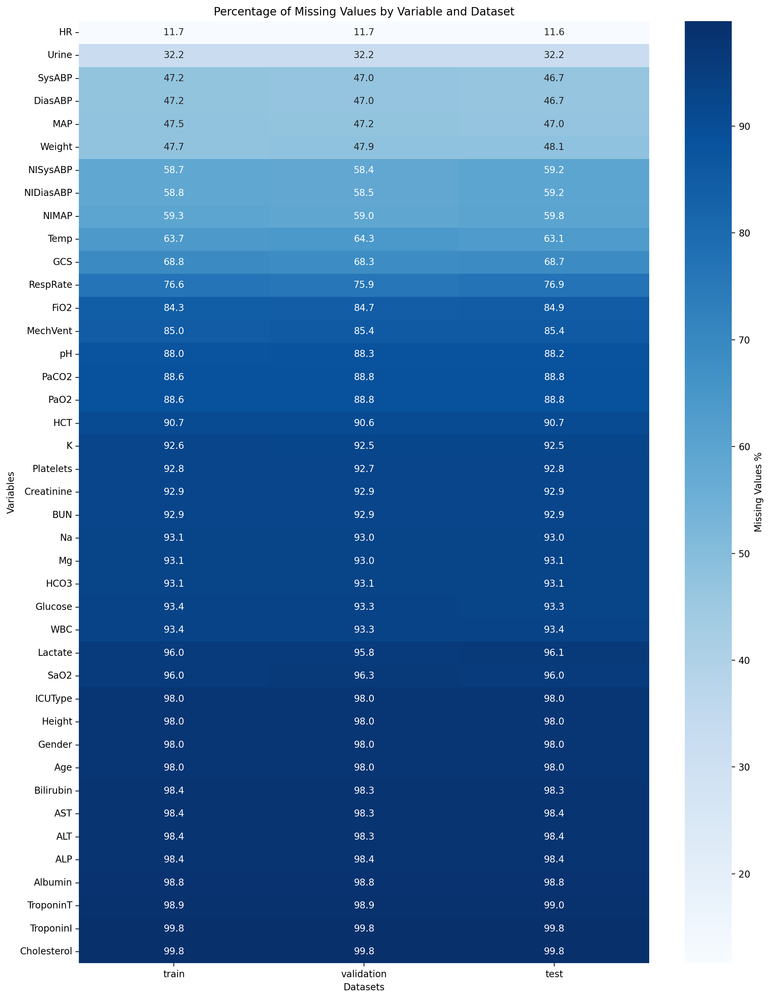

In [12]:
# Calculate missing value percentages for each variable in each dataset
missing_data = {}

for dataset_name in ['train', 'validation', 'test']:
    data = combined_data[combined_data['dataset'] == dataset_name]
    missing = (data.isnull().sum() / len(data)) * 100
    missing_data[dataset_name] = missing

# Create a DataFrame with missing percentages
missing_df = pd.DataFrame(missing_data)

# Remove Time, RecordID, In-hospital_death, and dataset columns as they don't have missing values
missing_df = missing_df.drop(['Time', 'RecordID', 'In-hospital_death', 'dataset'])

# Sort by average missing percentage
missing_df['avg'] = missing_df.mean(axis=1)
missing_df = missing_df.sort_values('avg', ascending=True)
missing_df = missing_df.drop('avg', axis=1)

# Create the plot
plt.figure(figsize=(12, 15))
sns.heatmap(missing_df, 
            annot=True, 
            fmt='.1f',
            cmap='Blues',
            cbar_kws={'label': 'Missing Values %'})

plt.title('Percentage of Missing Values by Variable and Dataset')
plt.ylabel('Variables')
plt.xlabel('Datasets')
plt.tight_layout()
plt.show()

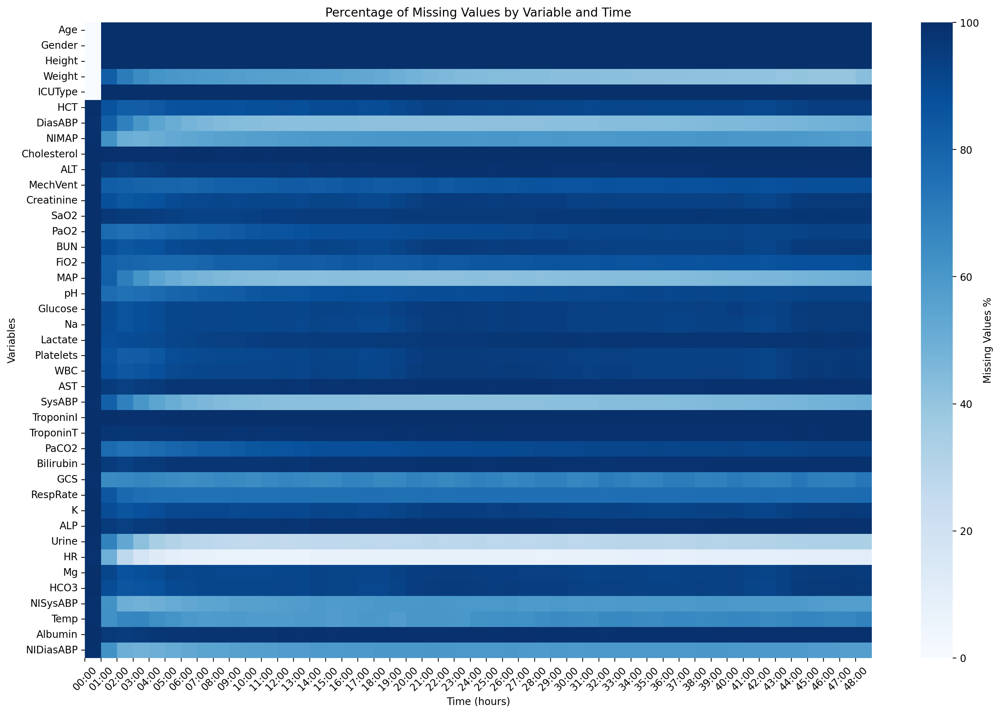

In [13]:
# Calculate missing value percentages for each variable at each time step
missing_by_time = {}

# Get all unique time points
time_points = sorted(combined_data['Time'].unique())

# Calculate missing percentages for each time point
for time in time_points:
    data_at_time = combined_data[combined_data['Time'] == time]
    missing = (data_at_time.isnull().sum() / len(data_at_time)) * 100
    missing_by_time[time] = missing

# Create a DataFrame with missing percentages
missing_df = pd.DataFrame(missing_by_time)

# Remove Time, RecordID, In-hospital_death, and dataset columns
missing_df = missing_df.drop(['Time', 'RecordID', 'In-hospital_death', 'dataset'])

# Create the plot
plt.figure(figsize=(15, 10))
sns.heatmap(missing_df, 
            cmap='Blues',
            cbar_kws={'label': 'Missing Values %'})

plt.title('Percentage of Missing Values by Variable and Time')
plt.ylabel('Variables')
plt.xlabel('Time (hours)')
plt.xticks(range(len(time_points)), time_points, rotation=45)
plt.tight_layout()
plt.show()

# Q1.3 Preprocess data for Machine Learning

## Simple forward fill for the missing values

In [14]:
train = pd.read_parquet("../data/set-a.parquet")
validation = pd.read_parquet("../data/set-b.parquet")
test = pd.read_parquet("../data/set-c.parquet")

- add the missing row when necassary so that every patient has the same number of rows
- perform the feedforward imputation 
- for the remaining values impute using the mean of the colmn

In [15]:
filled_train = train.groupby('RecordID').ffill()
filled_train["RecordID"] = train.RecordID
filled_train

,Time,Age,Gender,Height,Weight,ICUType,HCT,DiasABP,NIMAP,Cholesterol,...,Urine,HR,Mg,HCO3,NISysABP,Temp,Albumin,NIDiasABP,In-hospital_death,RecordID
0,00:00,35.0,0.0,-1.0,71.8,3.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,132592
1,01:00,35.0,0.0,-1.0,71.8,3.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,132592
2,02:00,35.0,0.0,-1.0,71.8,3.0,NaN,NaN,68.67,NaN,...,NaN,112.0,NaN,NaN,120.0,36.6,NaN,43.0,0,132592
3,03:00,35.0,0.0,-1.0,71.8,3.0,25.5,NaN,76.67,NaN,...,120.0,113.0,2.8,11.0,124.0,36.6,NaN,53.0,0,132592
4,04:00,35.0,0.0,-1.0,71.8,3.0,25.5,NaN,71.33,NaN,...,60.0,112.0,2.8,11.0,118.0,36.6,NaN,48.0,0,132592
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195995,44:00,56.0,1.0,182.9,100.0,1.0,34.4,81.0,NaN,NaN,...,50.0,95.0,1.8,29.0,NaN,37.2,NaN,NaN,0,141565
195996,45:00,56.0,1.0,182.9,100.0,1.0,34.4,84.0,NaN,NaN,...,140.0,94.0,1.8,29.0,NaN,37.4,NaN,NaN,0,141565
195997,46:00,56.0,1.0,182.9,100.0,1.0,34.4,95.0,NaN,NaN,...,140.0,102.0,1.8,29.0,NaN,37.4,NaN,NaN,0,141565
195998,47:00,56.0,1.0,182.9,100.0,1.0,34.4,70.0,NaN,NaN,...,80.0,99.0,1.8,29.0,NaN,37.4,NaN,NaN,0,141565


In [16]:
numerical_features = filled_train.drop(columns=["RecordID", "Time", "Gender", "ICUType", "MechVent"])
numerical_features_mean = numerical_features.mean()

numerical_features.fillna(numerical_features_mean, inplace=True)
numerical_features[["RecordID", "Time", "Gender", "ICUType", "MechVent"]] = filled_train[["RecordID", "Time", "Gender", "ICUType", "MechVent"]]
filled_train = numerical_features.fillna(-1)
filled_train = filled_train[new_order +  ["In-hospital_death"]]
filled_train

,Time,RecordID,Age,Gender,Height,Weight,ICUType,HCT,DiasABP,NIMAP,...,ALP,Urine,HR,Mg,HCO3,NISysABP,Temp,Albumin,NIDiasABP,In-hospital_death
0,00:00,132592,35.0,0.0,-1.0,71.8,3.0,31.583625,59.249764,76.411843,...,107.206897,139.302532,87.248902,2.030821,23.574313,117.046983,37.017982,2.997079,57.58772,0
1,01:00,132592,35.0,0.0,-1.0,71.8,3.0,31.583625,59.249764,76.411843,...,107.206897,139.302532,87.248902,2.030821,23.574313,117.046983,37.017982,2.997079,57.58772,0
2,02:00,132592,35.0,0.0,-1.0,71.8,3.0,31.583625,59.249764,68.670000,...,107.206897,139.302532,112.000000,2.030821,23.574313,120.000000,36.600000,2.997079,43.00000,0
3,03:00,132592,35.0,0.0,-1.0,71.8,3.0,25.500000,59.249764,76.670000,...,107.206897,120.000000,113.000000,2.800000,11.000000,124.000000,36.600000,2.997079,53.00000,0
4,04:00,132592,35.0,0.0,-1.0,71.8,3.0,25.500000,59.249764,71.330000,...,107.206897,60.000000,112.000000,2.800000,11.000000,118.000000,36.600000,2.997079,48.00000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195995,44:00,141565,56.0,1.0,182.9,100.0,1.0,34.400000,81.000000,76.411843,...,107.206897,50.000000,95.000000,1.800000,29.000000,117.046983,37.200000,2.997079,57.58772,0
195996,45:00,141565,56.0,1.0,182.9,100.0,1.0,34.400000,84.000000,76.411843,...,107.206897,140.000000,94.000000,1.800000,29.000000,117.046983,37.400000,2.997079,57.58772,0
195997,46:00,141565,56.0,1.0,182.9,100.0,1.0,34.400000,95.000000,76.411843,...,107.206897,140.000000,102.000000,1.800000,29.000000,117.046983,37.400000,2.997079,57.58772,0
195998,47:00,141565,56.0,1.0,182.9,100.0,1.0,34.400000,70.000000,76.411843,...,107.206897,80.000000,99.000000,1.800000,29.000000,117.046983,37.400000,2.997079,57.58772,0


In [17]:
filled_train.to_parquet("../data/set-a-filled.parquet", index=False)

In [18]:
filled_val = validation.groupby('RecordID').ffill()
filled_val["RecordID"] = validation.RecordID
filled_val

,Time,Age,Gender,Height,Weight,ICUType,HCT,DiasABP,NIMAP,Cholesterol,...,Urine,HR,Mg,HCO3,NISysABP,Temp,Albumin,NIDiasABP,In-hospital_death,RecordID
0,00:00,71.0,1.0,172.7,74.2,4.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,144404
1,01:00,71.0,1.0,172.7,74.2,4.0,NaN,60.0,85.00,NaN,...,140.0,85.0,NaN,NaN,147.0,37.4,NaN,68.0,0,144404
2,02:00,71.0,1.0,172.7,74.2,4.0,NaN,83.0,85.00,NaN,...,80.0,79.0,NaN,NaN,147.0,37.4,NaN,68.0,0,144404
3,03:00,71.0,1.0,172.7,74.2,4.0,NaN,61.0,85.00,NaN,...,85.0,79.0,NaN,NaN,147.0,37.4,NaN,68.0,0,144404
4,04:00,71.0,1.0,172.7,74.2,4.0,31.5,56.0,85.00,NaN,...,60.0,79.0,2.2,24.0,147.0,37.4,1.8,68.0,0,144404
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195995,44:00,85.0,0.0,-1.0,49.3,3.0,35.0,97.0,67.67,NaN,...,15.0,99.0,2.2,16.0,115.0,37.4,NaN,44.0,1,143372
195996,45:00,85.0,0.0,-1.0,49.3,3.0,35.0,52.0,67.67,NaN,...,15.0,99.0,2.2,16.0,115.0,37.4,NaN,44.0,1,143372
195997,46:00,85.0,0.0,-1.0,49.3,3.0,35.0,46.0,67.67,NaN,...,15.0,97.0,2.2,16.0,115.0,37.3,NaN,44.0,1,143372
195998,47:00,85.0,0.0,-1.0,49.3,3.0,35.0,46.0,67.67,NaN,...,14.0,95.0,2.2,16.0,115.0,37.3,NaN,44.0,1,143372


In [19]:
numerical_features = filled_val.drop(columns=["RecordID", "Time", "Gender", "ICUType", "MechVent"])

numerical_features.fillna(numerical_features_mean, inplace=True)
numerical_features[["RecordID", "Time", "Gender", "ICUType", "MechVent"]] = filled_val[["RecordID", "Time", "Gender", "ICUType", "MechVent"]]
filled_val = numerical_features.fillna(-1)
filled_val = filled_val[new_order +  ["In-hospital_death"]]
filled_val

,Time,RecordID,Age,Gender,Height,Weight,ICUType,HCT,DiasABP,NIMAP,...,ALP,Urine,HR,Mg,HCO3,NISysABP,Temp,Albumin,NIDiasABP,In-hospital_death
0,00:00,144404,71.0,1.0,172.7,74.2,4.0,31.583625,59.249764,76.411843,...,107.206897,139.302532,87.248902,2.030821,23.574313,117.046983,37.017982,2.997079,57.58772,0
1,01:00,144404,71.0,1.0,172.7,74.2,4.0,31.583625,60.000000,85.000000,...,107.206897,140.000000,85.000000,2.030821,23.574313,147.000000,37.400000,2.997079,68.00000,0
2,02:00,144404,71.0,1.0,172.7,74.2,4.0,31.583625,83.000000,85.000000,...,107.206897,80.000000,79.000000,2.030821,23.574313,147.000000,37.400000,2.997079,68.00000,0
3,03:00,144404,71.0,1.0,172.7,74.2,4.0,31.583625,61.000000,85.000000,...,107.206897,85.000000,79.000000,2.030821,23.574313,147.000000,37.400000,2.997079,68.00000,0
4,04:00,144404,71.0,1.0,172.7,74.2,4.0,31.500000,56.000000,85.000000,...,177.000000,60.000000,79.000000,2.200000,24.000000,147.000000,37.400000,1.800000,68.00000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195995,44:00,143372,85.0,0.0,-1.0,49.3,3.0,35.000000,97.000000,67.670000,...,107.206897,15.000000,99.000000,2.200000,16.000000,115.000000,37.400000,2.997079,44.00000,1
195996,45:00,143372,85.0,0.0,-1.0,49.3,3.0,35.000000,52.000000,67.670000,...,107.206897,15.000000,99.000000,2.200000,16.000000,115.000000,37.400000,2.997079,44.00000,1
195997,46:00,143372,85.0,0.0,-1.0,49.3,3.0,35.000000,46.000000,67.670000,...,107.206897,15.000000,97.000000,2.200000,16.000000,115.000000,37.300000,2.997079,44.00000,1
195998,47:00,143372,85.0,0.0,-1.0,49.3,3.0,35.000000,46.000000,67.670000,...,107.206897,14.000000,95.000000,2.200000,16.000000,115.000000,37.300000,2.997079,44.00000,1


In [20]:
filled_val.to_parquet("../data/set-b-filled.parquet", index=False)

In [21]:
filled_test = test.groupby('RecordID').ffill()
filled_test["RecordID"] = test.RecordID
filled_test

,Time,Age,Gender,Height,Weight,ICUType,HCT,DiasABP,NIMAP,Cholesterol,...,Urine,HR,Mg,HCO3,NISysABP,Temp,Albumin,NIDiasABP,In-hospital_death,RecordID
0,00:00,58.0,1.0,-1.0,-1.0,4.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,154617
1,01:00,58.0,1.0,-1.0,-1.0,4.0,NaN,53.000000,73.3325,NaN,...,300.0,96.0,NaN,NaN,108.0,36.3,NaN,56.0,0,154617
2,02:00,58.0,1.0,-1.0,-1.0,4.0,26.2,56.666667,73.3325,NaN,...,100.0,72.0,1.4,21.0,108.0,36.3,NaN,56.0,0,154617
3,03:00,58.0,1.0,-1.0,-1.0,4.0,23.2,57.500000,73.3325,NaN,...,60.0,77.0,1.4,22.0,108.0,36.3,NaN,56.0,0,154617
4,04:00,58.0,1.0,-1.0,-1.0,4.0,23.2,53.000000,73.3325,NaN,...,50.0,88.0,1.4,22.0,108.0,35.9,NaN,56.0,0,154617
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195995,44:00,50.0,1.0,-1.0,45.5,1.0,35.0,NaN,80.0000,117.0,...,NaN,64.0,2.8,27.0,110.0,35.4,NaN,65.0,0,153161
195996,45:00,50.0,1.0,-1.0,45.5,1.0,33.6,NaN,80.0000,117.0,...,NaN,64.0,2.1,26.0,110.0,35.4,NaN,65.0,0,153161
195997,46:00,50.0,1.0,-1.0,45.5,1.0,33.6,NaN,94.0000,117.0,...,NaN,65.0,2.1,26.0,124.0,34.3,NaN,79.0,0,153161
195998,47:00,50.0,1.0,-1.0,45.5,1.0,33.6,NaN,90.6700,117.0,...,NaN,65.0,2.1,26.0,128.0,34.3,NaN,72.0,0,153161


In [22]:
numerical_features = filled_test.drop(columns=["RecordID", "Time", "Gender", "ICUType", "MechVent"])

numerical_features.fillna(numerical_features_mean, inplace=True)
numerical_features[["RecordID", "Time", "Gender", "ICUType", "MechVent"]] = filled_test[["RecordID", "Time", "Gender", "ICUType", "MechVent"]]
filled_test = numerical_features.fillna(-1)
filled_test = filled_test[new_order +  ["In-hospital_death"]]
filled_test

,Time,RecordID,Age,Gender,Height,Weight,ICUType,HCT,DiasABP,NIMAP,...,ALP,Urine,HR,Mg,HCO3,NISysABP,Temp,Albumin,NIDiasABP,In-hospital_death
0,00:00,154617,58.0,1.0,-1.0,-1.0,4.0,31.583625,59.249764,76.411843,...,107.206897,139.302532,87.248902,2.030821,23.574313,117.046983,37.017982,2.997079,57.58772,0
1,01:00,154617,58.0,1.0,-1.0,-1.0,4.0,31.583625,53.000000,73.332500,...,107.206897,300.000000,96.000000,2.030821,23.574313,108.000000,36.300000,2.997079,56.00000,0
2,02:00,154617,58.0,1.0,-1.0,-1.0,4.0,26.200000,56.666667,73.332500,...,107.206897,100.000000,72.000000,1.400000,21.000000,108.000000,36.300000,2.997079,56.00000,0
3,03:00,154617,58.0,1.0,-1.0,-1.0,4.0,23.200000,57.500000,73.332500,...,107.206897,60.000000,77.000000,1.400000,22.000000,108.000000,36.300000,2.997079,56.00000,0
4,04:00,154617,58.0,1.0,-1.0,-1.0,4.0,23.200000,53.000000,73.332500,...,107.206897,50.000000,88.000000,1.400000,22.000000,108.000000,35.900000,2.997079,56.00000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195995,44:00,153161,50.0,1.0,-1.0,45.5,1.0,35.000000,59.249764,80.000000,...,107.206897,139.302532,64.000000,2.800000,27.000000,110.000000,35.400000,2.997079,65.00000,0
195996,45:00,153161,50.0,1.0,-1.0,45.5,1.0,33.600000,59.249764,80.000000,...,107.206897,139.302532,64.000000,2.100000,26.000000,110.000000,35.400000,2.997079,65.00000,0
195997,46:00,153161,50.0,1.0,-1.0,45.5,1.0,33.600000,59.249764,94.000000,...,107.206897,139.302532,65.000000,2.100000,26.000000,124.000000,34.300000,2.997079,79.00000,0
195998,47:00,153161,50.0,1.0,-1.0,45.5,1.0,33.600000,59.249764,90.670000,...,107.206897,139.302532,65.000000,2.100000,26.000000,128.000000,34.300000,2.997079,72.00000,0


In [23]:
filled_test.to_parquet("../data/set-c-filled.parquet", index=False)